# 調理手順

In [0]:
!pip install dask --upgrade

    100% |████████████████████████████████| 716kB 9.4MB/s 
albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.8 which is incompatible.
  Found existing installation: dask 1.1.5
    Uninstalling dask-1.1.5:
      Successfully uninstalled dask-1.1.5


In [0]:
ls

sample_data/


## CPythonのインストール

In [0]:
!pip install Cython

## darknetのclone

In [0]:
!git clone https://github.com/pjreddie/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 5901, done.
remote: Total 5901 (delta 0), reused 0 (delta 0), pack-reused 5901
Receiving objects: 100% (5901/5901), 6.17 MiB | 28.84 MiB/s, done.
Resolving deltas: 100% (3925/3925), done.


## 作業の場所を移動する

In [0]:
cd darknet/

/content/darknet


## YOLOをコンパイルする

In [0]:
!make

mkdir -p obj
mkdir -p backup
mkdir -p results
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/gemm.c -o obj/gemm.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/utils.c -o obj/utils.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/cuda.c -o obj/cuda.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/deconvolutional_layer.c -o obj/deconvolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/convolutional_layer.c -o obj/convolutional_layer.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/list.c -o obj/list.o
gcc -Iinclude/ -Isrc/ -Wall -Wno-unused-result -Wno-unknown-pragmas -Wfatal-errors -fPIC -Ofast -c ./src/image.c -o obj/image.o
gcc 

## YOLO3のモデルをダウンロードする

In [0]:
!wget https://pjreddie.com/media/files/yolov3.weights

--2019-04-23 01:07:02--  https://pjreddie.com/media/files/yolov3.weights
Resolving pjreddie.com (pjreddie.com)... 128.208.4.108
Connecting to pjreddie.com (pjreddie.com)|128.208.4.108|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 248007048 (237M) [application/octet-stream]
Saving to: ‘yolov3.weights’

yolov3.weights      100%[===================>] 236.52M  41.2MB/s    in 7.1s    

2019-04-23 01:07:09 (33.4 MB/s) - ‘yolov3.weights’ saved [248007048/248007048]



# 物体検出を試みる

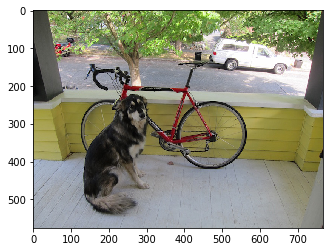

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

#画像の読み込み
im = Image.open("data/dog.jpg")
#
plt.imshow(im)
#表示
plt.show()


In [0]:
! ./darknet detect cfg/yolov3.cfg yolov3.weights data/dog.jpg

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
    7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    8 res    5                 152 x 152 x 128   ->   152 x 152 x 128
    9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
   10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
   11 res    8                 152 x 

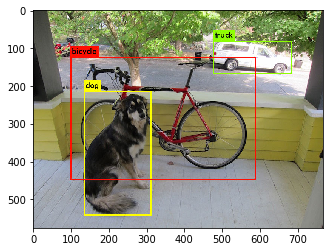

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

#画像の読み込み
im = Image.open("predictions.jpg")
#
plt.imshow(im)
plt.grid(False)
#表示
plt.show()

# もう一枚テスト

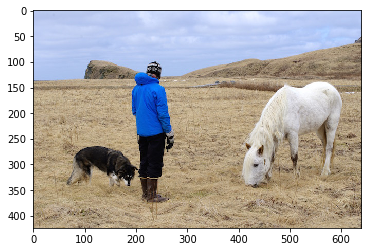

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

#画像の読み込み
im = Image.open("data/person.jpg")
#
plt.imshow(im)
#表示
plt.show()

## 物体検出プログラム実行

In [0]:
! ./darknet detect cfg/yolov3.cfg yolov3.weights data/person.jpg

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
    7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    8 res    5                 152 x 152 x 128   ->   152 x 152 x 128
    9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
   10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
   11 res    8                 152 x 

In [0]:
ls


backup/    include/        LICENSE.gen   Makefile         results/
cfg/       libdarknet.a    LICENSE.gpl   obj/             scripts/
darknet*   libdarknet.so*  LICENSE.meta  predictions.jpg  src/
data/      LICENSE         LICENSE.mit   python/          yolov3.weights
examples/  LICENSE.fuck    LICENSE.v1    README.md


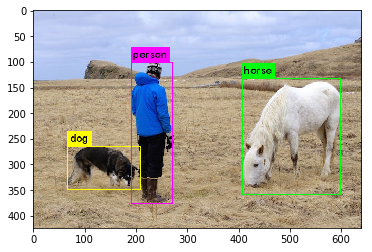

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

#画像の読み込み
im = Image.open("predictions.jpg")
#
plt.imshow(im)
plt.grid(False)
#表示
plt.show()

In [0]:
from google.colab import files
files.upload()

Saving test03.jpg to test03.jpg


{'test03.jpg': b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00H\x00H\x00\x00\xff\xe1\x04*Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x08\x01\x0f\x00\x02\x00\x00\x00\x06\x00\x00\x00n\x01\x10\x00\x02\x00\x00\x00\x0e\x00\x00\x00t\x01\x1a\x00\x05\x00\x00\x00\x01\x00\x00\x00\x82\x01\x1b\x00\x05\x00\x00\x00\x01\x00\x00\x00\x8a\x01(\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x011\x00\x02\x00\x00\x00\x0b\x00\x00\x00\x92\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00\x9e\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\xb2\x00\x00\x00\x00Apple\x00iPhone 6 Plus\x00\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x01Photos 4.0\x00\x002015:08:02 11:29:07\x00\x00 \x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x028\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x02@\x88"\x00\x03\x00\x00\x00\x01\x00\x02\x00\x00\x88\'\x00\x03\x00\x00\x00\x01\x00(\x00\x00\x90\x00\x00\x07\x00\x00\x00\x040221\x90\x03\x00\x02\x00\x00\x00\x14\x00\x00\x02H\x90\x04\x00\x02\x00\x00\x00\x14\x00\x00\x02\\\x91\x01\x00\x07\x00\x00\x00\x04\x01\x02\x03\x00

In [0]:
ls

backup/    libdarknet.a    LICENSE.meta     python/      test02.jpg
cfg/       libdarknet.so*  LICENSE.mit      README.md    test03.jpg
darknet*   LICENSE         LICENSE.v1       results/     test.jpg
data/      LICENSE.fuck    Makefile         scripts/     yolov3.weights
examples/  LICENSE.gen     obj/             src/
include/   LICENSE.gpl     predictions.jpg  test02.jpeg


In [0]:
! ./darknet detect cfg/yolov3.cfg yolov3.weights test.jpg

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32  0.639 BFLOPs
    1 conv     64  3 x 3 / 2   608 x 608 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    2 conv     32  1 x 1 / 1   304 x 304 x  64   ->   304 x 304 x  32  0.379 BFLOPs
    3 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64  3.407 BFLOPs
    4 res    1                 304 x 304 x  64   ->   304 x 304 x  64
    5 conv    128  3 x 3 / 2   304 x 304 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    6 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
    7 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
    8 res    5                 152 x 152 x 128   ->   152 x 152 x 128
    9 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64  0.379 BFLOPs
   10 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128  3.407 BFLOPs
   11 res    8                 152 x 

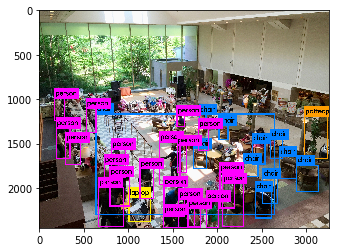

In [0]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

#画像の読み込み
im = Image.open("predictions.jpg")
#
plt.imshow(im)
plt.grid(False)
#表示
plt.show()

In [0]:
ls

backup/    libdarknet.a    LICENSE.meta     python/     test.jpg
cfg/       libdarknet.so*  LICENSE.mit      README.md   yolov3.weights
darknet*   LICENSE         LICENSE.v1       results/
data/      LICENSE.fuck    Makefile         scripts/
examples/  LICENSE.gen     obj/             src/
include/   LICENSE.gpl     predictions.jpg  test02.jpg


結果ファイルをダウンロするするときに使用してください。

In [0]:
from google.colab import files


files.download('predictions.jpg')